## Import Libraries

In [1]:
# Data Analysis      
import pandas as pd          # data analysis library for handling structured data             
import numpy as np           # mathematical library for working with numerical data
import os, sys

# from metrics import *
# Add the previous directory to sys.path
sys.path.append(os.path.abspath('../'))

# Now you can import the metrics module
from metrics import *
import os 

# Visualization
import matplotlib.pyplot as plt     # data visualization library for creating graphs and charts
%matplotlib inline
import seaborn as sns        # data visualization library based on matplotlib for creating more attractive visualizations
import missingno as msno    #visualize missing data
from sklearn.metrics import mean_squared_error, r2_score 

# Ignore warnings
import warnings
warnings.filterwarnings("ignore") 

pd.set_option('display.max_rows', 50) 
pd.set_option('display.max_columns', 500) 
pd.set_option('display.width', 1000) 


# Function to filter out LightGBM warnings
def suppress_lightgbm_warnings(message, category, filename, lineno, file=None, line=None):
    return 'LightGBM' not in str(message)

warnings.showwarning = suppress_lightgbm_warnings


In [2]:
root_dir = r"C:\Users\pault\OneDrive - University of Oklahoma\GRA - Bio-Manufacturing\1. ML-Cytovance-OU-Research"
os.chdir(root_dir)

## Preprocessing

> Drop invariant columns

In [3]:
# drop invariant columns 
def drop_invariant_columns(df):
    """
    This function takes a list of DataFrames and drops specified invariant columns from each DataFrame.

    Parameters:
    experiment_data (list): List of pandas DataFrames.
    invariant_cols (list): List of column names to be dropped from each DataFrame.

    Returns:
    list: A new list of DataFrames with invariant columns dropped.
    """
    invariant_cols = ['input_vessel_type',	'input_vessel_volume',	'input_vessel_name',	'input_agitation_rpm',	'input_DO_%',	
                  'input_pH_setpoint',	'input_gas_flow',	'input_air_%',	'input_O2',	'input_Temp_c',	'input_media_type',	
                  'input_feed_type',	'input_glucose_limit']
    

    # Create a copy of the DataFrame to avoid modifying the original data.
    updated_df = df.drop(columns=invariant_cols, axis=1)
    return updated_df




> Missing Value Imputation

In [4]:
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import IterativeImputer  
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestRegressor    

def convert_WCW_zero(df):
    df['output_WCW_gl'] = df.apply(lambda row: 0 if row['input_Timepoint (hr)'] in [0,1, 2] else row['output_WCW_gl'], axis=1)
    # df['output_WCW_gl'] = df.apply(lambda row: 0 if row.name in [pd.Timestamp("2024-01-01 00:00:00"), pd.Timestamp("2024-01-01 01:00:00"), pd.Timestamp("2024-01-01 02:00:00")] else row['output_WCW_gl'], axis=1)
    return df


def impute_missing_values_iteratively(X_a, exclude=None):
    # Convert specific values to zero based on conditions
    X_a = convert_WCW_zero(X_a)
    X = X_a.copy()

    # Normalize the exclude parameter to be a list if it's not None or already a list
    if exclude is not None and not isinstance(exclude, list):
        exclude = [exclude]

    for col in X.columns:
        # Check if column is excluded or if it's 'input_Timepoint (hr)'
        if exclude is not None and col in exclude:
            continue

        # Process columns that are not excluded and meet the conditions
        if X[col].isnull().any() and X[col].dtype == 'object' and col != 'input_Timepoint (hr)':
            X[col] = pd.to_numeric(X[col], errors='coerce')

    imputer = IterativeImputer(
        estimator=RandomForestRegressor(n_estimators=100, random_state=0),  # the estimator to predict the NA
        initial_strategy='mean',  # how will NA be imputed in step 1
        max_iter=10,  # number of cycles
        imputation_order='ascending',  # the order in which to impute the variables
        n_nearest_features=None,  # whether to limit the number of predictors
        skip_complete=True,  # whether to ignore variables without NA
        random_state=0,)

    # Select columns that are now either originally numeric or successfully converted from object
    numeric_cols = [col for col in X.select_dtypes(include=['number']).columns if col not in exclude] if exclude is not None else X.select_dtypes(include=['number']).columns

    # Impute missing values only in the selected numeric columns that are not excluded
    X_imputed = imputer.fit_transform(X[numeric_cols])
    X_a[numeric_cols] = X_imputed

    return X_a 

> Scale and Concat

In [5]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler


# Use StandardScaler for this
scale_cols = ['output_WCW_gl', 'output_agitation', 'output_air_%', 'output_D0_%', 'output_gasflow', 'output_O2', 'output_Ph', 
              'output_feed_%', 'output_feed', 'output_Temp', 'output_glycerol_gl', 
              'output_glucose_gl', 'output_acetate_mmol_l', 'output_phosphate_mmol_l']

def scale_and_concat(X, columns_to_transform = scale_cols, train = False, scaler = None):
    """
    Scales selected columns in a DataFrame using StandardScaler and concatenates them with the rest of the DataFrame.

    Args:
        df (pandas.DataFrame): The DataFrame containing the data.
        columns_to_transform (list): List of column names to be scaled.

    Returns:
        pandas.DataFrame: The concatenated DataFrame with scaled columns.
    """
    
    # Filter out columns in 'columns_to_transform' that are not present in 'X'
    valid_columns = [col for col in columns_to_transform if col in X.columns]
    
    if train == True:
        # scaler = MinMaxScaler() # Initialize the scaler 
        scaler = StandardScaler()   # Initialize the scaler
        scaler.fit(X[valid_columns])  # Fit only on the training set
    else:
        scaler = scaler

    # Create a copy of the original DataFrame
    df_concatenated = X.copy()

    # Scale the selected columns
    scaled_columns = scaler.transform(X[valid_columns])

    # Create a DataFrame with the scaled columns
    df_scaled = pd.DataFrame(scaled_columns, columns=valid_columns, index=X.index)
            
    # Concatenate the scaled columns with the rest of the DataFrame
    df_concatenated = pd.concat([df_concatenated.drop(columns=valid_columns, axis = 1), df_scaled], axis=1)

    if train == True:
        return df_concatenated, scaler
    else:
        return df_concatenated
    



## Building the Model

> Titer Value imputation

In [6]:

import random 


experiment_names = ['exp_210623_1', 'exp_210623_2', 'exp_210623_3', 'exp_210623_4', 
                    'exp_211013_1', 'exp_211013_2', 'exp_211013_3', 'exp_211013_4', 
                    'exp_211130_1', 'exp_211130_2', 'exp_211130_3', 'exp_211130_4', 
                    'exp_220309demo_1', 'exp_220309demo_2', 'exp_220309demo_3', 'exp_220309demo_4',
                    'exp_220315c1_1', 'exp_220315c1_2', 'exp_220315c1_3', 'exp_220315c1_4', 'exp_220315c1_5', 'exp_220315c1_6',
                    'exp_220329c2_1', 'exp_220329c2_2', 'exp_220329c2_3', 'exp_220329c2_4', 'exp_220329c2_5', 'exp_220329c2_6', 
                    'exp_220822_1', 'exp_220822_2', 'exp_220822_3', 'exp_220822_4']



from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils import shuffle
from collections import defaultdict


def load_data(batch_names, num_impute=len(experiment_names)):   #You can change num_impute to 5. However, for this case i will impute all
    df_list = []
    impute_batches = np.random.choice(batch_names, size=num_impute, replace=False) 
    for b_name in batch_names:
        df = pd.read_csv(f"titer/data/{b_name}.csv")
        df = drop_invariant_columns(df)
        df.name = b_name
        df['batch'] = b_name
        
        # Find the first point where 'output_phosphate_mmol_l' <= 3
        condition_met_idx = df[df['output_phosphate_mmol_l'] <= 5].index.min()
        df['original_titer'] = df['output_titre_µgl'].copy()        # this copies the original titer for use in plotting 
        # Check if such a point exists
        if pd.notnull(condition_met_idx) and condition_met_idx > 1:
            # Calculate the index two rows up from the found point
            start_idx = max(condition_met_idx - 2, 0) 
            # Set 'output_titre_µgl' to 0.0 from start_idx to the beginning of the dataset
            df.loc[:start_idx, 'output_titre_µgl'] = 0.0
            
        # Find the last index with 'output_titre_µgl' == 0.0
        last_zero_idx = df[df['output_titre_µgl'] == 0.0].index.max() 

        # Determine the last non-NaN value or use the threshold
        if pd.isnull(df['output_titre_µgl'].iloc[-1]):
            final_value = random.uniform(0.3, 2.2)  # Threshold value if the last value is NaN
        else:
            final_value = df['output_titre_µgl'].dropna().iloc[-1]  # Last non-NaN value

        # Define the start and end indices for filling
        start_i = last_zero_idx + 1 if pd.notnull(last_zero_idx) else 0
        end_i = df.index.max()

        # Apply the exponential function to fill missing values
        num_points = end_i - start_i + 1
        exp_values = np.linspace(0, 1, num_points)
        exp_values = final_value * (np.exp(exp_values) - 1) / (np.exp(1) - 1)  # Normalized exponential

        for i, val in zip(range(start_i, end_i + 1), exp_values):
            if b_name in impute_batches:
                df.loc[i, 'output_titre_µgl'] = val
                df['input_batch'] = b_name

        df_list.append(df)
        
    return df_list 


def concatenate_impute_split(experiment_names):
    
    # Load data
    df_list = load_data(experiment_names)

    # Concatenate all data into a single DataFrame
    full_data = pd.concat(df_list, ignore_index=True)

    full_data_inputed = impute_missing_values_iteratively(full_data, exclude = ['output_titre_µgl', 'input_batch', 'original_titer'])  # Impute missing values iteratively to avoid over-fitting on the test set

    # Split the data back into the original batches using the 'batch' column and return as a list
    # batched_dataframes_list = [group.drop('batch', axis=1) for _, group in full_data_cyclical_time.groupby('batch', sort=False)]
    batched_dataframes_list = [group for _, group in full_data_inputed.groupby('batch', sort=False)]
    
    return batched_dataframes_list



def titer_imputation(experiment_names):
    df_batch_list = concatenate_impute_split(experiment_names)
    
    # Trial and Error: scale and cocatenate the dataset
    dataset = pd.concat(df_batch_list, ignore_index=True)

    return dataset



dataset = titer_imputation(experiment_names)

In [7]:
dataset

,input_Timepoint (hr),output_OD600,output_WCW_gl,output_agitation,output_air_%,output_D0_%,output_gasflow,output_O2,output_Ph,output_feed_%,output_feed,output_Temp,output_glycerol_gl,output_glucose_gl,output_acetate_mmol_l,output_phosphate_mmol_l,output_titre_µgl,batch,original_titer,input_batch
0,0.0,0.353000,0.000,1185.440000,100.000000,96.810000,5.010000,0.000000,6.910000,0.00,0.00000,30.19,6.4300,0.243000,1.9500,18.0000,0.000000,exp_210623_1,NaN,exp_210623_1
1,2.0,0.547000,0.000,1185.320000,100.000000,97.950000,5.000000,0.000000,6.775341,0.00,0.00000,29.99,5.2310,0.181900,3.7795,21.8014,0.000000,exp_210623_1,NaN,exp_210623_1
2,4.0,1.590000,0.000,1185.220000,100.000000,94.600000,5.000000,0.000000,6.850000,0.00,0.00000,30.01,6.4305,-0.004392,9.5241,27.5919,0.000000,exp_210623_1,NaN,exp_210623_1
3,6.0,4.460000,56.805,1184.830000,100.000000,82.450000,5.000000,0.000000,6.780000,0.00,0.00000,30.04,4.0480,-0.005319,15.6948,25.3705,0.000000,exp_210623_1,NaN,exp_210623_1
4,8.0,11.320000,51.770,1184.500000,100.000000,66.110000,5.000000,0.000000,6.710000,0.00,0.00000,29.99,0.0000,0.000000,15.6100,14.4700,0.000000,exp_210623_1,NaN,exp_210623_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679,32.0,83.600000,207.500,1184.912964,99.576492,40.890980,4.793379,0.422386,6.194422,10.60,0.36040,25.99,0.2718,19.202700,4.0200,-0.0100,0.781089,exp_220822_4,NaN,exp_220822_4
680,36.0,87.400000,208.500,1184.800049,99.456673,40.179340,4.711772,0.543087,6.226009,9.01,0.30634,26.00,0.0097,18.399210,2.7800,-0.0200,1.045407,exp_220822_4,NaN,exp_220822_4
681,40.0,93.266667,217.500,1184.574951,99.654694,40.592091,4.850256,0.344494,6.214839,7.66,0.26044,26.01,0.1204,16.133740,4.1000,-0.0300,1.344918,exp_220822_4,NaN,exp_220822_4
682,44.0,93.400000,216.500,1185.463989,99.543571,37.069462,4.800520,0.463291,6.221002,6.32,0.21488,25.98,0.0099,11.673240,4.8400,-0.1100,1.684309,exp_220822_4,NaN,exp_220822_4


> Madgwick Filter

In [8]:
# Control variables
    # Feed Type --> not in the dataset since it is invariant 
    # output_Ph (pH)
    # output_Temp (Temperature)
    # output_D0_% (Dissolved Oxygen Percentage)
    # Induction OD/Feed OD --> not in the dataset 

# Other Features
    # input_Timepoint (hr)
    # output_OD600 (OD600nm)
    # output_WCW_gl (Wet cell weight)
    # Agitation   (output_agitation)
    # output_air_% (Air)
    # output_gasflow (Gas Flow)
    # output_O2 (Oxygen)
    # output_feed_% (Feed Percentage)
    # output_feed (Feed)
    # output_glycerol_gl (Glycerol)
    # output_glucose_gl (Glucose)
    # output_acetate_mmol_l (Acetate)
    # output_phosphate_mmol_l (Phosphate)
    
# Target variable
    # output_titre_µgl (Titer)


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

class MadgwickFilter:
    def __init__(self, beta=0.1):
        self.beta = beta
        self.q = np.array([1.0, 0.0, 0.0, 0.0])  # Unit quaternion representing orientation

    def update(self, gyroscope, accelerometer, dt):
        q = self.q
        ax, ay, az = accelerometer
        gx, gy, gz = gyroscope

        # Normalize accelerometer measurement
        norm = np.sqrt(ax * ax + ay * ay + az * az)
        if norm == 0:
            return  # Handle NaN
        ax /= norm
        ay /= norm
        az /= norm

        # Auxiliary variables to avoid repeated calculations
        _2q0 = 2.0 * q[0]
        _2q1 = 2.0 * q[1]
        _2q2 = 2.0 * q[2]
        _2q3 = 2.0 * q[3]
        _4q0 = 4.0 * q[0]
        _4q1 = 4.0 * q[1]
        _4q2 = 4.0 * q[2]
        _8q1 = 8.0 * q[1]
        _8q2 = 8.0 * q[2]
        q0q0 = q[0] * q[0]
        q1q1 = q[1] * q[1]
        q2q2 = q[2] * q[2]
        q3q3 = q[3] * q[3]

        # Gradient decent algorithm corrective step
        s0 = _4q0 * q2q2 + _2q2 * ax + _4q0 * q1q1 - _2q1 * ay
        s1 = _4q1 * q3q3 - _2q3 * ax + 4.0 * q0q0 * q[1] - _2q0 * ay - _4q1 + _8q1 * q1q1 + _8q1 * q2q2 + _4q1 * az
        s2 = 4.0 * q0q0 * q[2] + _2q0 * ax + _4q2 * q3q3 - _2q3 * ay - _4q2 + _8q2 * q1q1 + _8q2 * q2q2 + _4q2 * az
        s3 = 4.0 * q1q1 * q[3] - _2q1 * ax + 4.0 * q2q2 * q[3] - _2q2 * ay
        norm = np.sqrt(s0 * s0 + s1 * s1 + s2 * s2 + s3 * s3)  # Normalize step magnitude
        if norm == 0:
            return  # Handle NaN
        s0 /= norm
        s1 /= norm
        s2 /= norm
        s3 /= norm

        # Apply feedback step
        qDot1 = 0.5 * (-q[1] * gx - q[2] * gy - q[3] * gz) - self.beta * s0
        qDot2 = 0.5 * (q[0] * gx + q[2] * gz - q[3] * gy) - self.beta * s1
        qDot3 = 0.5 * (q[0] * gy - q[1] * gz + q[3] * gx) - self.beta * s2
        qDot4 = 0.5 * (q[0] * gz + q[1] * gy - q[2] * gx) - self.beta * s3

        # Integrate rate of change of quaternion to yield quaternion
        q[0] += qDot1 * dt
        q[1] += qDot2 * dt
        q[2] += qDot3 * dt
        q[3] += qDot4 * dt
        norm = np.sqrt(q[0] * q[0] + q[1] * q[1] + q[2] * q[2] + q[3] * q[3])  # Normalize quaternion
        q[0] /= norm
        q[1] /= norm
        q[2] /= norm
        q[3] /= norm

        self.q = q

    def get_estimate(self):
        return self.q


In [10]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_squared_error, r2_score



def train_evaluate_madgwick_filter(dataset, beta=0.1):
    unique_batches = dataset['batch'].unique()

    madgwick_results = []
    for batch in unique_batches:
        batch_data = dataset[dataset['batch'] == batch]

        labels = batch_data['original_titer'].to_numpy()
        time_vector = batch_data['input_Timepoint (hr)'].to_numpy()
        
        batch_data = batch_data.drop(columns=['batch', 'original_titer', 'input_batch'], axis=1)
        
        madgwick_filter = MadgwickFilter(beta=beta)
        
        estimated_titer = []
        for i in range(1, len(batch_data)):
            gyroscope = batch_data.iloc[i-1][['output_OD600', 'output_WCW_gl', 'output_agitation']].to_numpy()
            accelerometer = batch_data.iloc[i][['output_air_%', 'output_gasflow', 'output_O2']].to_numpy()
            dt = time_vector[i] - time_vector[i-1]
            madgwick_filter.update(gyroscope, accelerometer, dt)
            estimated_titer.append(madgwick_filter.get_estimate()[0])  # Using the first component of quaternion as the estimate
            
        # Create DataFrame for filtered results
        filtered_df = pd.DataFrame({
            'original_timepoint': time_vector[1:],
            'original_titer': labels[1:],
            'output_titre_µgl': estimated_titer
        })
        madgwick_results.append((filtered_df, batch))
        
    return madgwick_results
        
madgwick_results = train_evaluate_madgwick_filter(dataset) 



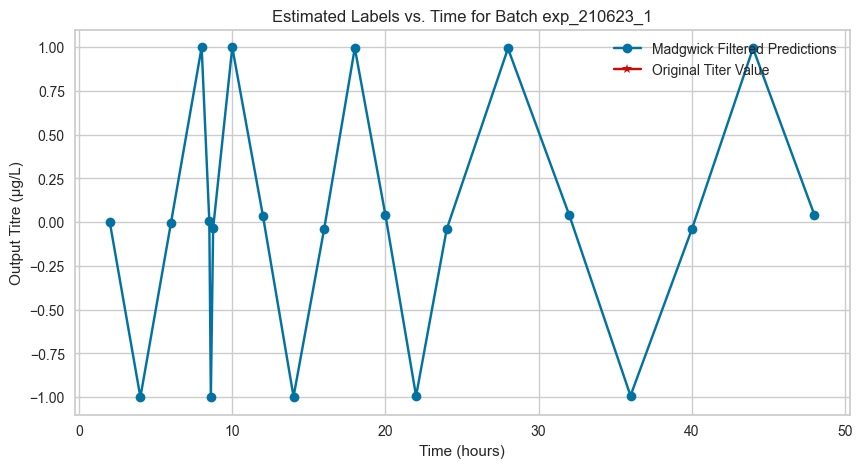

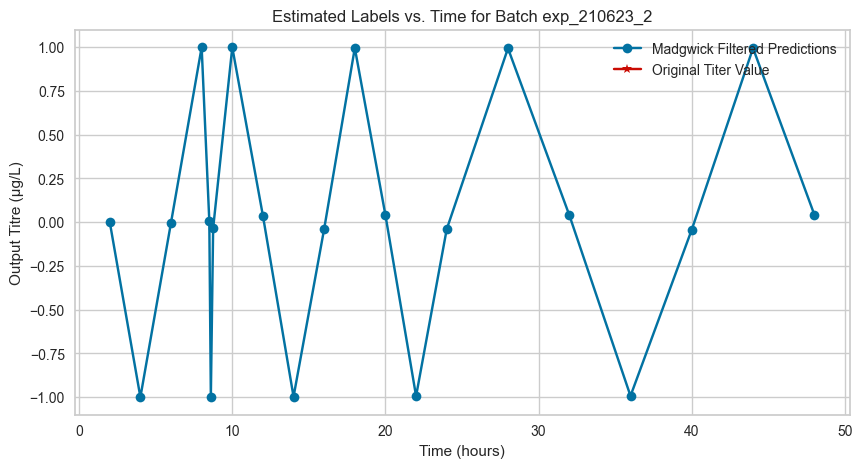

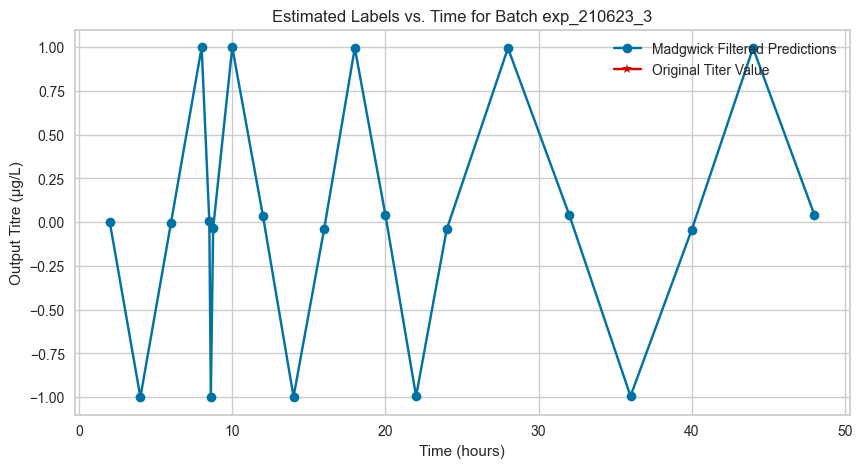

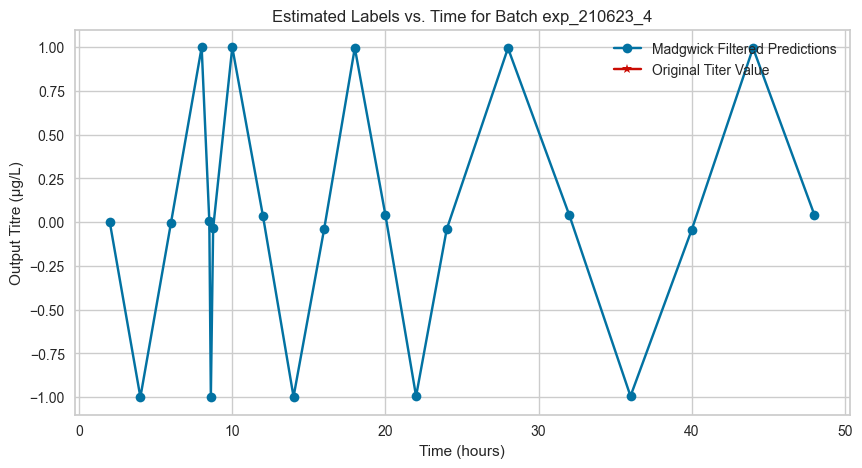

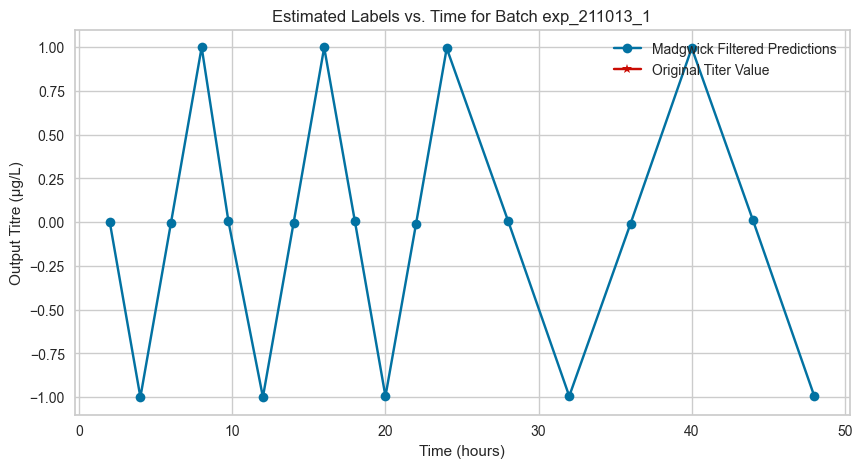

...

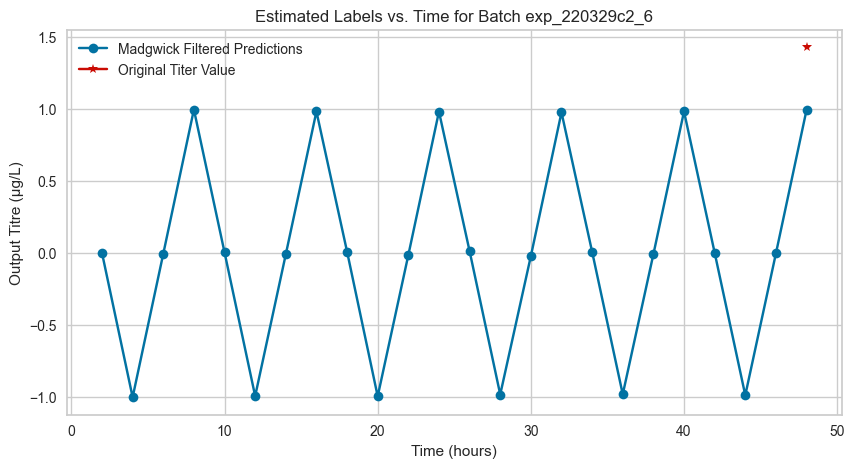

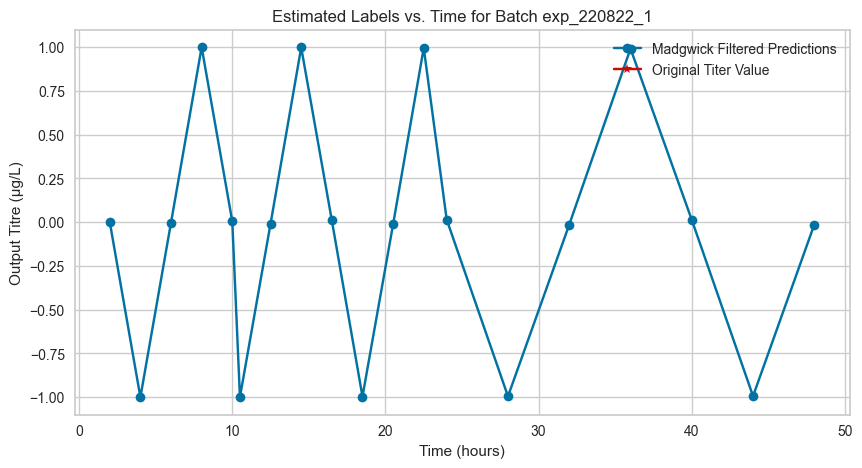

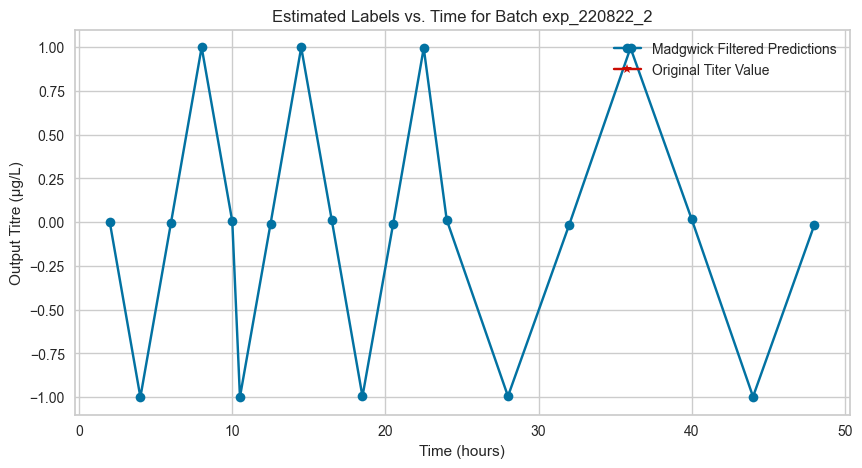

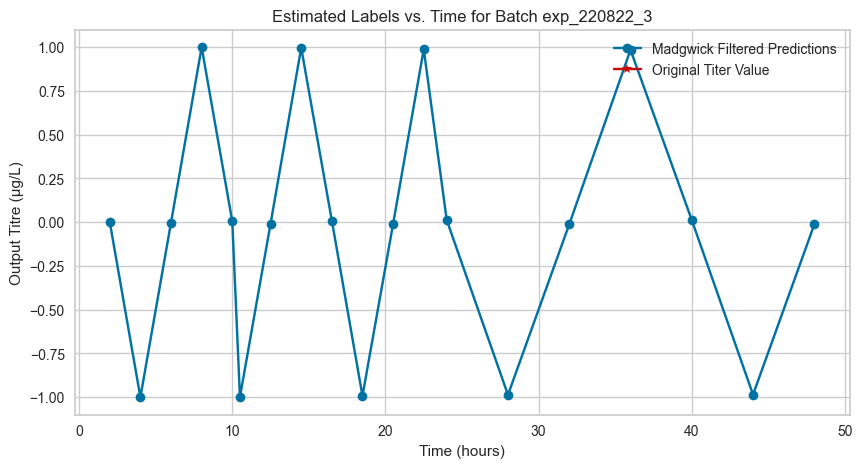

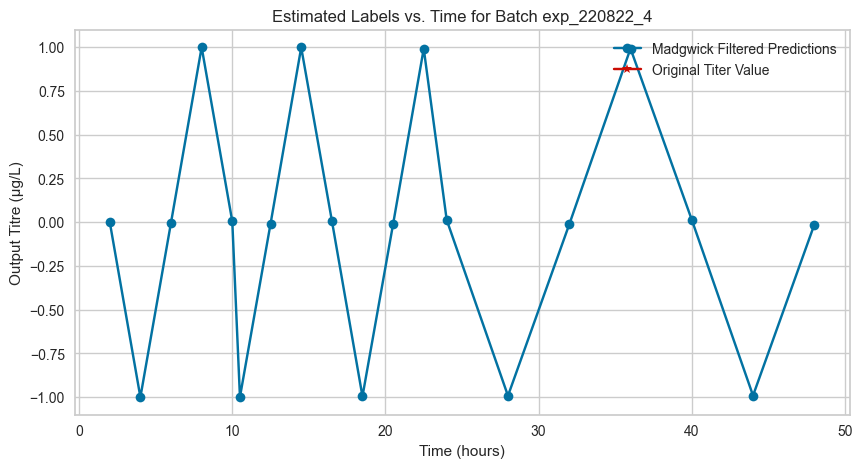

In [11]:
# Plotting each batch's estimated labels vs. time
for batch_data, batch in madgwick_results:
    plt.figure(figsize=(10, 5))
    plt.plot(batch_data['original_timepoint'], batch_data['output_titre_µgl'], marker='o', linestyle='-', color='b', label='Madgwick Filtered Predictions')
    plt.plot(batch_data['original_timepoint'], batch_data['original_titer'], marker='*', linestyle='-', color='r', label='Original Titer Value') 
    plt.title(f'Estimated Labels vs. Time for Batch {batch}')
    plt.xlabel('Time (hours)')
    plt.ylabel('Output Titre (µg/L)')
    plt.grid(True)
    plt.legend()  # This adds the legend to the plot
    plt.show()


> Another Approach using Hyperparameter Optimization

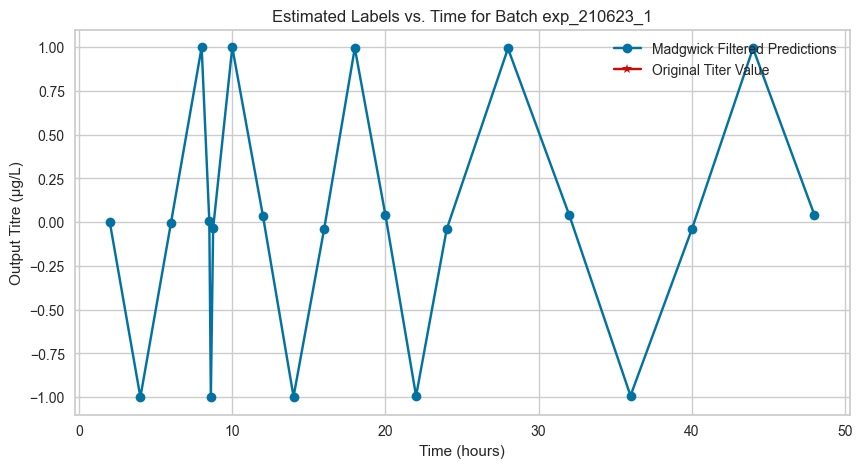

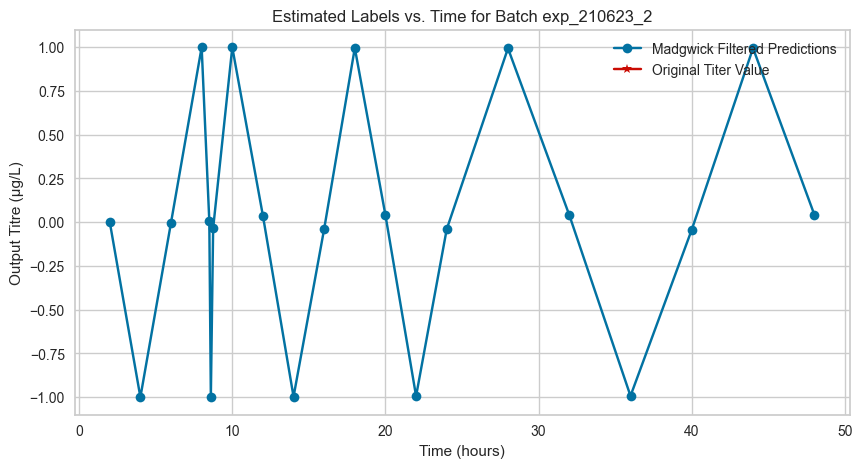

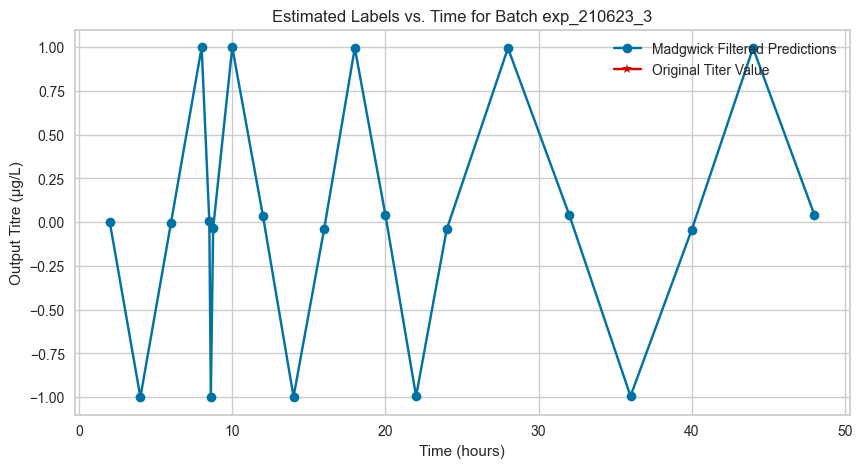

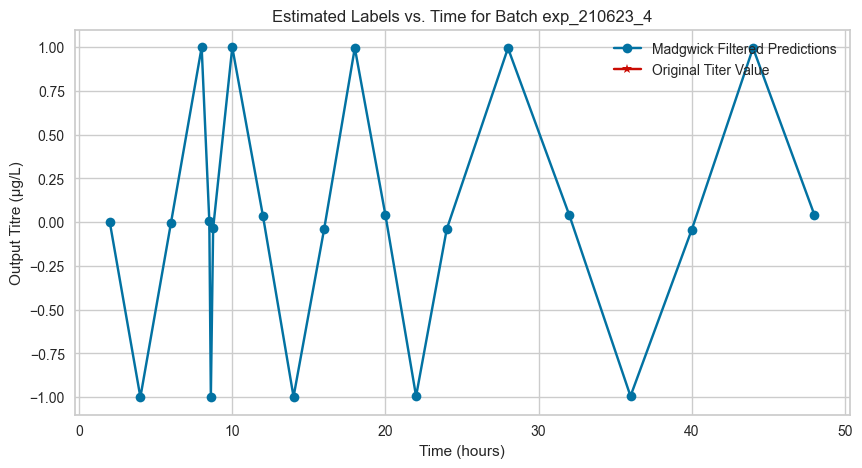

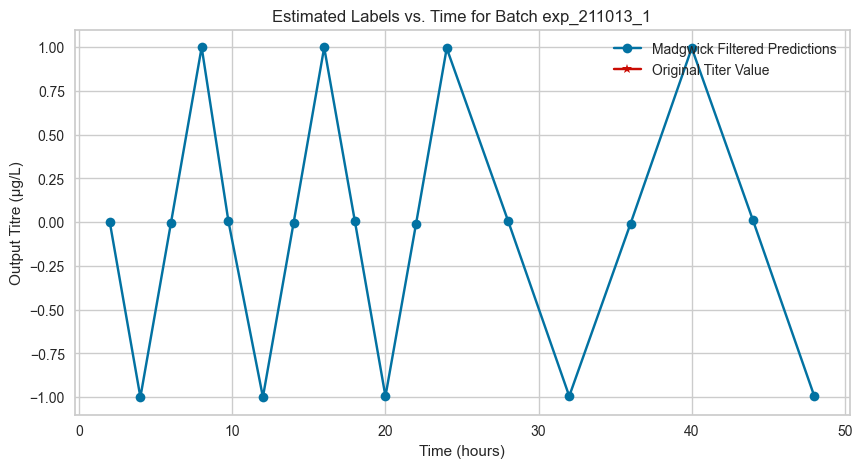

...

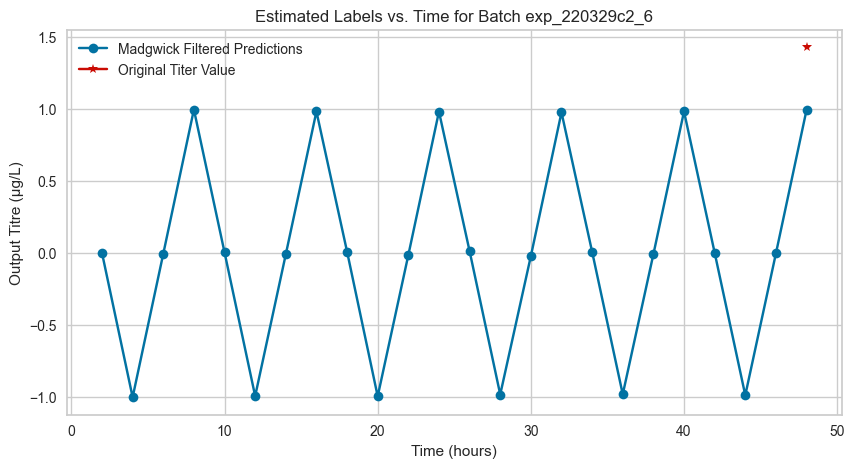

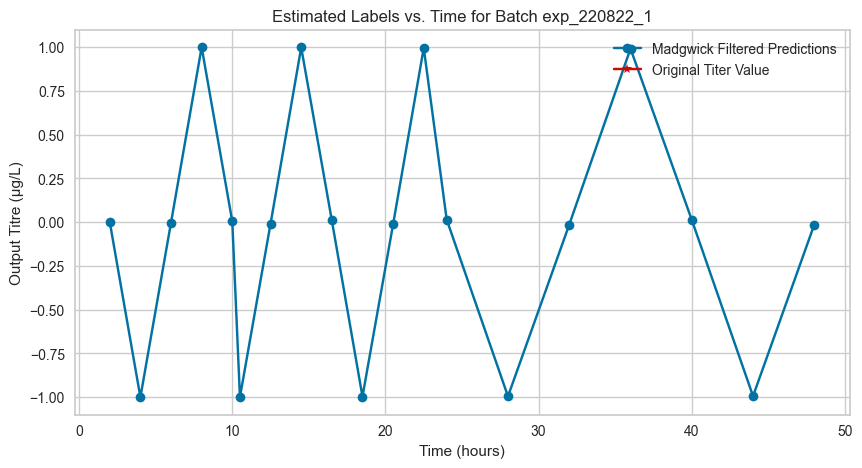

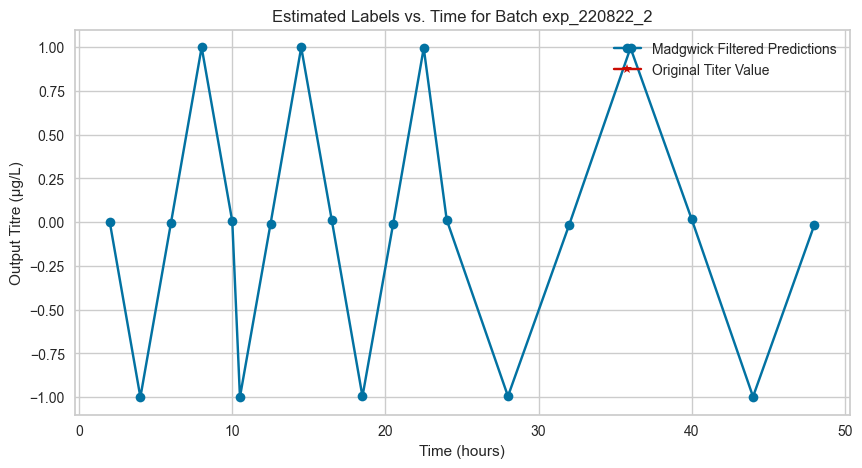

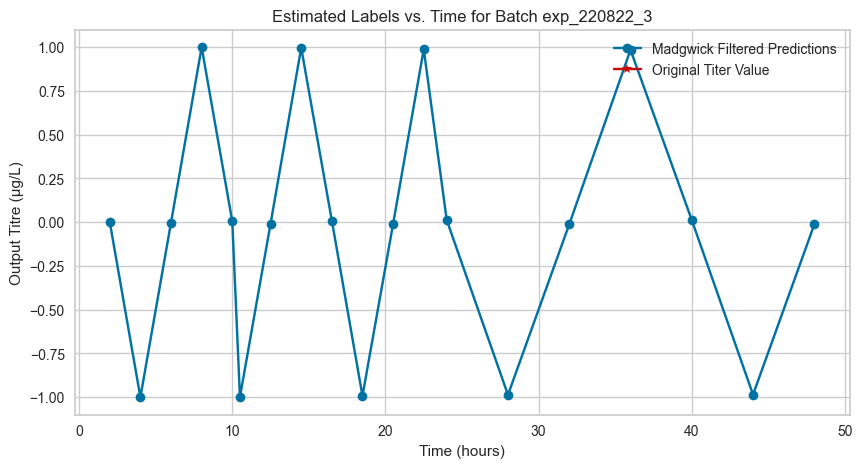

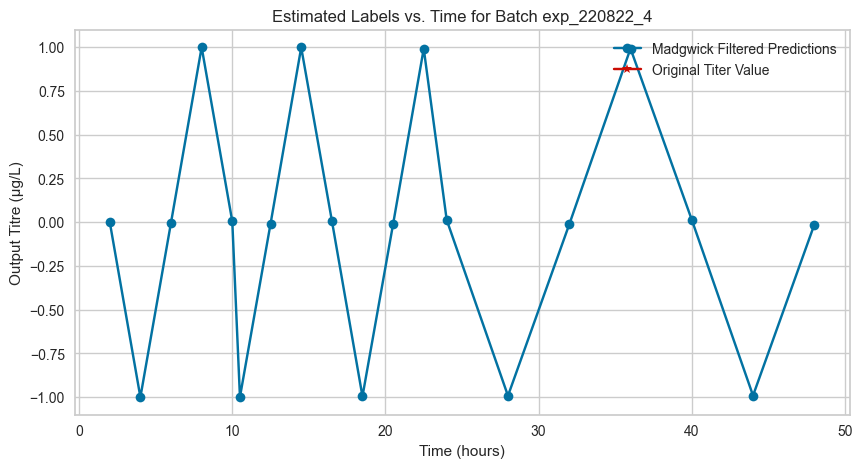

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_error

class MadgwickFilter:
    def __init__(self, beta=0.1):
        self.beta = beta
        self.q = np.array([1.0, 0.0, 0.0, 0.0])  # Unit quaternion representing orientation

    def update(self, gyroscope, accelerometer, dt):
        q = self.q
        ax, ay, az = accelerometer
        gx, gy, gz = gyroscope

        # Normalize accelerometer measurement
        norm = np.sqrt(ax * ax + ay * ay + az * az)
        if norm == 0:
            return  # Handle NaN
        ax /= norm
        ay /= norm
        az /= norm

        # Auxiliary variables to avoid repeated calculations
        _2q0 = 2.0 * q[0]
        _2q1 = 2.0 * q[1]
        _2q2 = 2.0 * q[2]
        _2q3 = 2.0 * q[3]
        _4q0 = 4.0 * q[0]
        _4q1 = 4.0 * q[1]
        _4q2 = 4.0 * q[2]
        _8q1 = 8.0 * q[1]
        _8q2 = 8.0 * q[2]
        q0q0 = q[0] * q[0]
        q1q1 = q[1] * q[1]
        q2q2 = q[2] * q[2]
        q3q3 = q[3] * q[3]

        # Gradient decent algorithm corrective step
        s0 = _4q0 * q2q2 + _2q2 * ax + _4q0 * q1q1 - _2q1 * ay
        s1 = _4q1 * q3q3 - _2q3 * ax + 4.0 * q0q0 * q[1] - _2q0 * ay - _4q1 + _8q1 * q1q1 + _8q1 * q2q2 + _4q1 * az
        s2 = 4.0 * q0q0 * q[2] + _2q0 * ax + _4q2 * q3q3 - _2q3 * ay - _4q2 + _8q2 * q1q1 + _8q2 * q2q2 + _4q2 * az
        s3 = 4.0 * q1q1 * q[3] - _2q1 * ax + 4.0 * q2q2 * q[3] - _2q2 * ay
        norm = np.sqrt(s0 * s0 + s1 * s1 + s2 * s2 + s3 * s3)  # Normalize step magnitude
        if norm == 0:
            return  # Handle NaN
        s0 /= norm
        s1 /= norm
        s2 /= norm
        s3 /= norm

        # Apply feedback step
        qDot1 = 0.5 * (-q[1] * gx - q[2] * gy - q[3] * gz) - self.beta * s0
        qDot2 = 0.5 * (q[0] * gx + q[2] * gz - q[3] * gy) - self.beta * s1
        qDot3 = 0.5 * (q[0] * gy - q[1] * gz + q[3] * gx) - self.beta * s2
        qDot4 = 0.5 * (q[0] * gz + q[1] * gy - q[2] * gx) - self.beta * s3

        # Integrate rate of change of quaternion to yield quaternion
        q[0] += qDot1 * dt
        q[1] += qDot2 * dt
        q[2] += qDot3 * dt
        q[3] += qDot4 * dt
        norm = np.sqrt(q[0] * q[0] + q[1] * q[1] + q[2] * q[2] + q[3] * q[3])  # Normalize quaternion
        q[0] /= norm
        q[1] /= norm
        q[2] /= norm
        q[3] /= norm

        self.q = q

    def get_estimate(self):
        return self.q

def train_evaluate_madgwick_filter(dataset, beta=0.1):
    unique_batches = dataset['batch'].unique()

    madgwick_results = []
    for batch in unique_batches:
        batch_data = dataset[dataset['batch'] == batch]

        labels = batch_data['original_titer'].to_numpy()
        labels_2 = batch_data['output_titre_µgl'].to_numpy()
        
        time_vector = batch_data['input_Timepoint (hr)'].to_numpy()
        
        batch_data = batch_data.drop(columns=['batch', 'original_titer', 'input_batch'], axis=1)
        
        madgwick_filter = MadgwickFilter(beta=beta)
        
        estimated_titer = []
        for i in range(1, len(batch_data)):
            gyroscope = batch_data.iloc[i-1][['output_OD600', 'output_WCW_gl', 'output_agitation']].to_numpy()
            accelerometer = batch_data.iloc[i][['output_air_%', 'output_gasflow', 'output_O2']].to_numpy()
            dt = time_vector[i] - time_vector[i-1]
            madgwick_filter.update(gyroscope, accelerometer, dt)
            estimated_titer.append(madgwick_filter.get_estimate()[0])  # Using the first component of quaternion as the estimate
            
        # Create DataFrame for filtered results
        filtered_df = pd.DataFrame({
            'original_timepoint': time_vector[1:],
            'original_titer': labels[1:],
            'output_titre_µgl': estimated_titer,
            'output_titre_µgl_2': labels_2[1:]
        })
        madgwick_results.append((filtered_df, batch))
        
    return madgwick_results

def objective_function(params, dataset):
    beta = params[0]
    results = train_evaluate_madgwick_filter(dataset, beta)
    mse_list = []
    for batch_data, _ in results:
        mse = mean_squared_error(batch_data['output_titre_µgl_2'], batch_data['output_titre_µgl'])
        mse_list.append(mse)
    return np.mean(mse_list)

def optimize_hyperparameters(dataset):
    from scipy.optimize import minimize
    
    initial_guess = [0.1]
    bounds = [(0.001, 1.0)]
    
    result = minimize(objective_function, initial_guess, args=(dataset,), bounds=bounds, method='L-BFGS-B')
    best_params = result.x
    return best_params


best_params = optimize_hyperparameters(dataset)
beta = best_params[0]

madgwick_results = train_evaluate_madgwick_filter(dataset, beta)

# Plotting each batch's estimated labels vs. time
for batch_data, batch in madgwick_results:
    plt.figure(figsize=(10, 5))
    plt.plot(batch_data['original_timepoint'], batch_data['output_titre_µgl'], marker='o', linestyle='-', color='b', label='Madgwick Filtered Predictions')
    plt.plot(batch_data['original_timepoint'], batch_data['original_titer'], marker='*', linestyle='-', color='r', label='Original Titer Value') 
    plt.title(f'Estimated Labels vs. Time for Batch {batch}')
    plt.xlabel('Time (hours)')
    plt.ylabel('Output Titre (µg/L)')
    plt.grid(True)
    plt.legend()  # This adds the legend to the plot
    plt.show()


> Another Approach, but Implementation with All Features and Control Variables

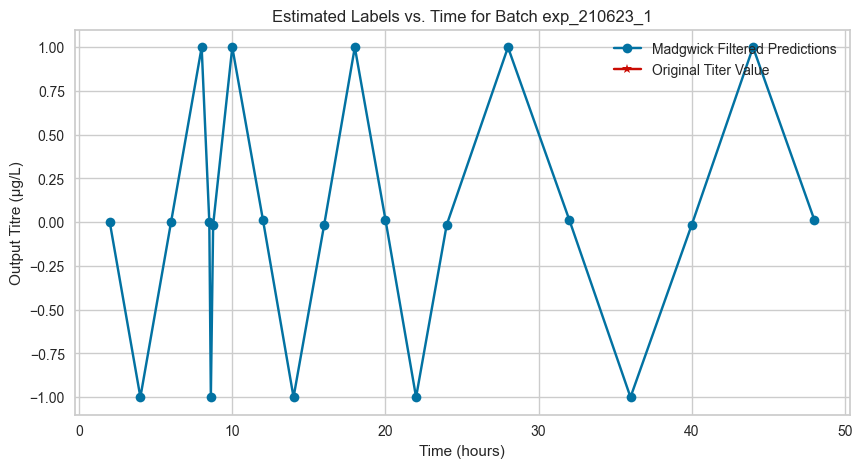

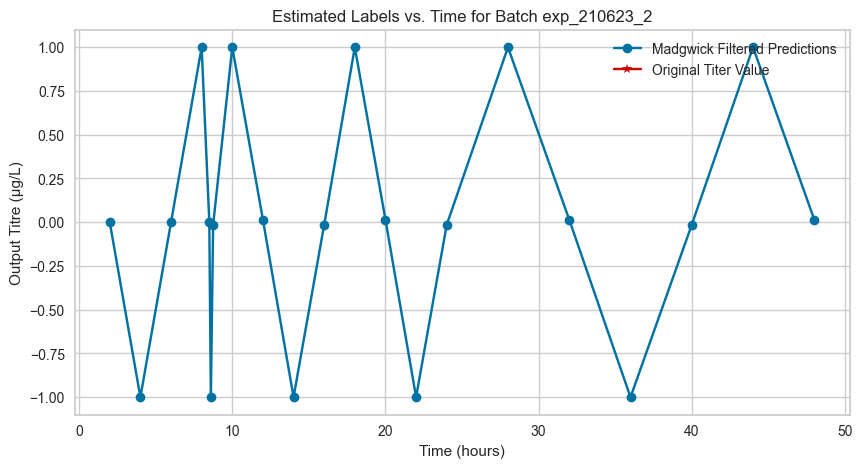

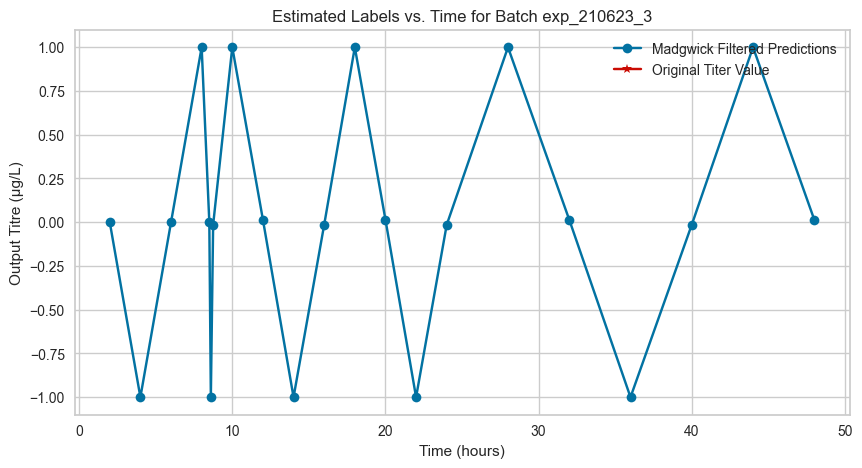

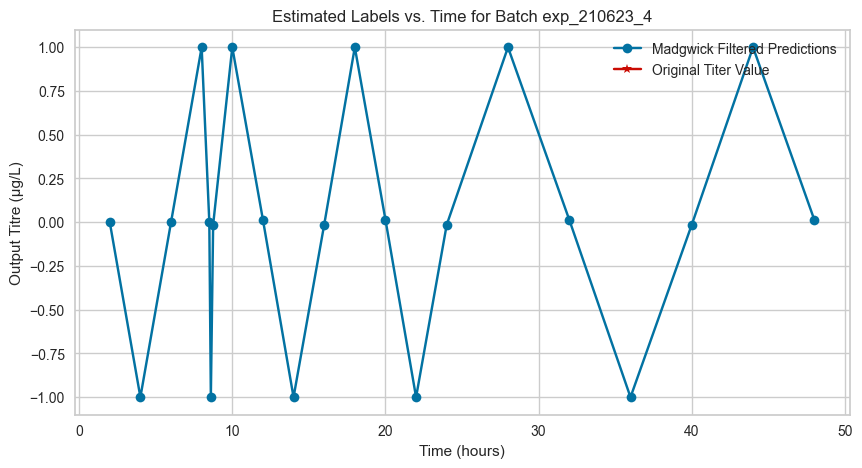

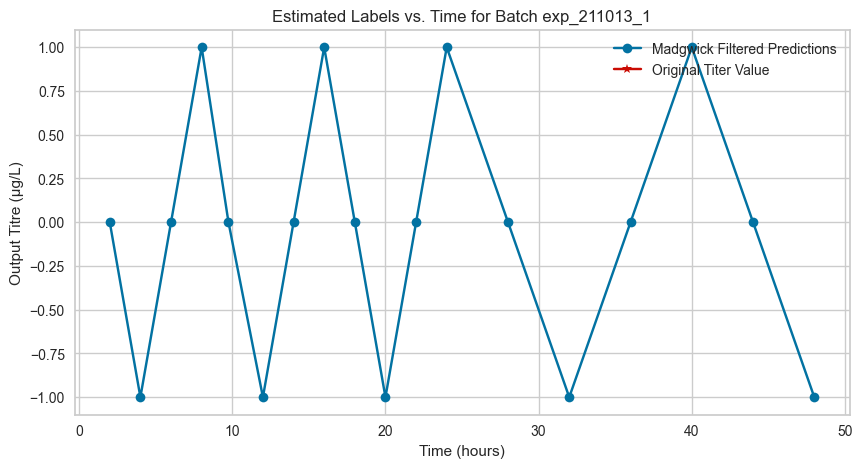

...

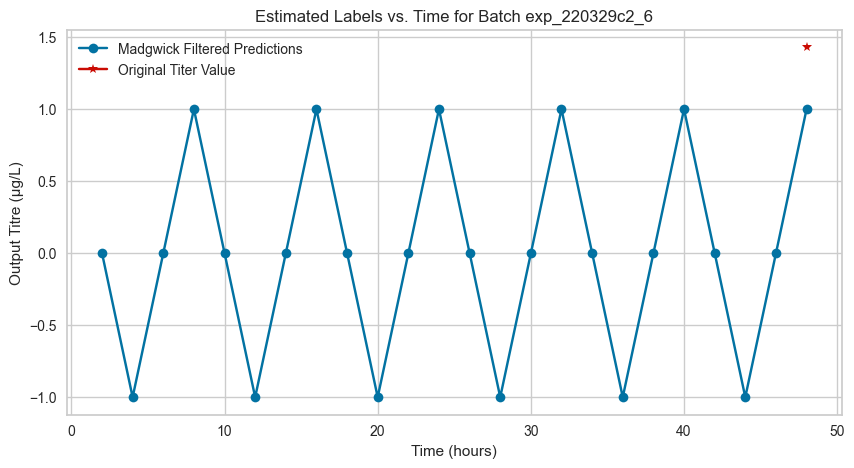

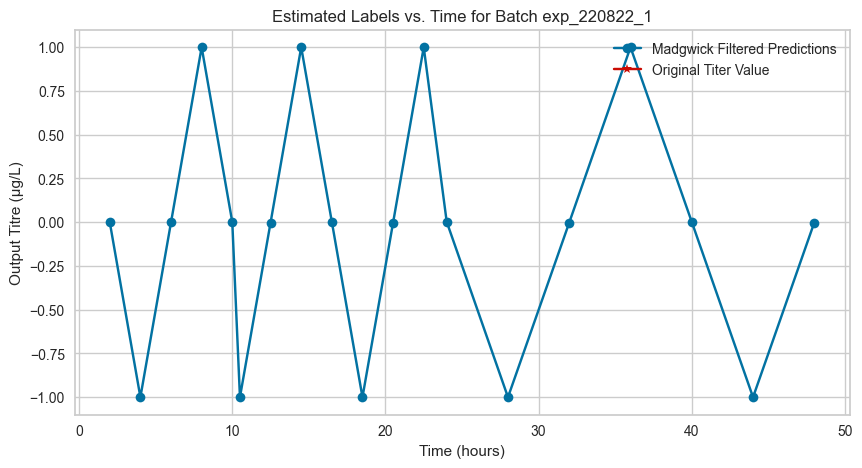

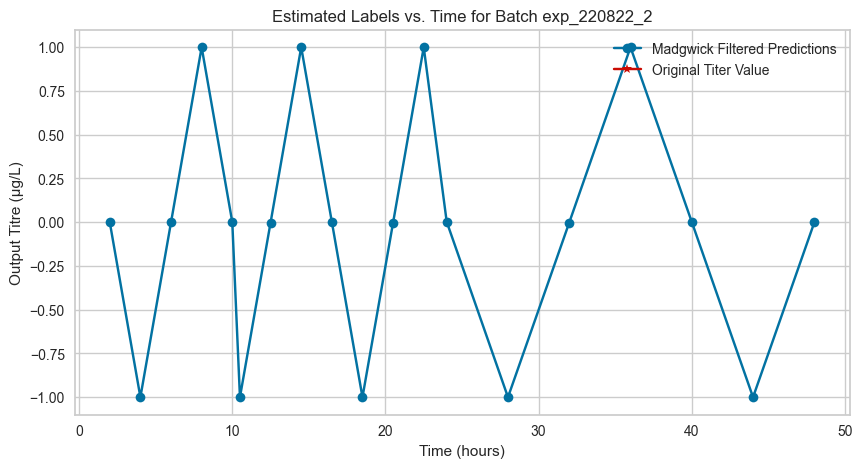

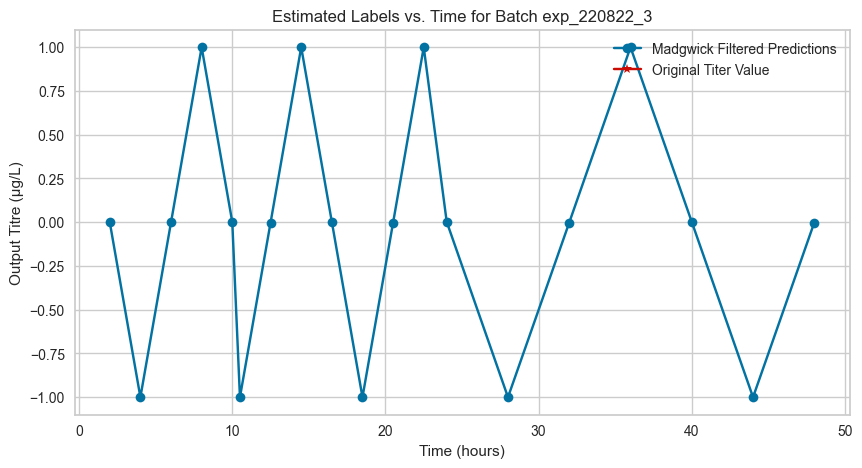

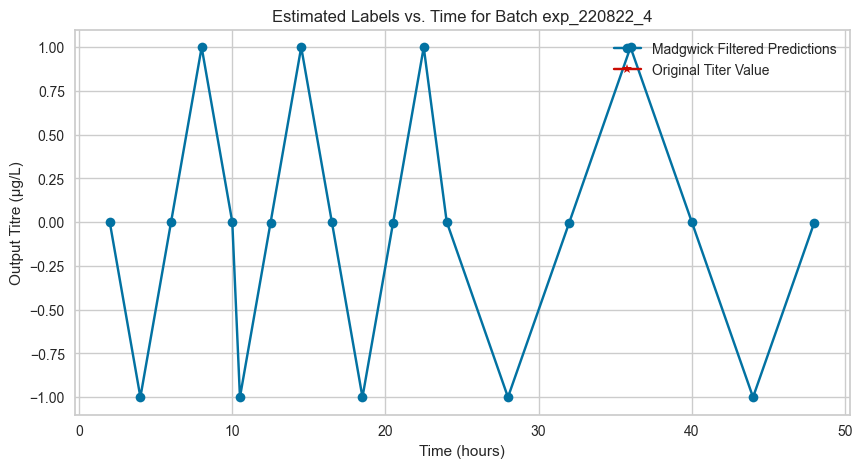

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_error

class MadgwickFilter:
    def __init__(self, beta=0.1):
        self.beta = beta
        self.q = np.array([1.0, 0.0, 0.0, 0.0])  # Unit quaternion representing orientation

    def update(self, gyroscope, accelerometer, dt):
        q = self.q

        # Sum all feature values to use as accelerometer and gyroscope inputs
        ax = np.sum(accelerometer)
        ay = np.sum(accelerometer)
        az = np.sum(accelerometer)
        gx = np.sum(gyroscope)
        gy = np.sum(gyroscope)
        gz = np.sum(gyroscope)

        # Normalize accelerometer measurement
        norm = np.sqrt(ax * ax + ay * ay + az * az)
        if norm == 0:
            return  # Handle NaN
        ax /= norm
        ay /= norm
        az /= norm

        # Auxiliary variables to avoid repeated calculations
        _2q0 = 2.0 * q[0]
        _2q1 = 2.0 * q[1]
        _2q2 = 2.0 * q[2]
        _2q3 = 2.0 * q[3]
        _4q0 = 4.0 * q[0]
        _4q1 = 4.0 * q[1]
        _4q2 = 4.0 * q[2]
        _8q1 = 8.0 * q[1]
        _8q2 = 8.0 * q[2]
        q0q0 = q[0] * q[0]
        q1q1 = q[1] * q[1]
        q2q2 = q[2] * q[2]
        q3q3 = q[3] * q[3]

        # Gradient decent algorithm corrective step
        s0 = _4q0 * q2q2 + _2q2 * ax + _4q0 * q1q1 - _2q1 * ay
        s1 = _4q1 * q3q3 - _2q3 * ax + 4.0 * q0q0 * q[1] - _2q0 * ay - _4q1 + _8q1 * q1q1 + _8q1 * q2q2 + _4q1 * az
        s2 = 4.0 * q0q0 * q[2] + _2q0 * ax + _4q2 * q3q3 - _2q3 * ay - _4q2 + _8q2 * q1q1 + _8q2 * q2q2 + _4q2 * az
        s3 = 4.0 * q1q1 * q[3] - _2q1 * ax + 4.0 * q2q2 * q[3] - _2q2 * ay
        norm = np.sqrt(s0 * s0 + s1 * s1 + s2 * s2 + s3 * s3)  # Normalize step magnitude
        if norm == 0:
            return  # Handle NaN
        s0 /= norm
        s1 /= norm
        s2 /= norm
        s3 /= norm

        # Apply feedback step
        qDot1 = 0.5 * (-q[1] * gx - q[2] * gy - q[3] * gz) - self.beta * s0
        qDot2 = 0.5 * (q[0] * gx + q[2] * gz - q[3] * gy) - self.beta * s1
        qDot3 = 0.5 * (q[0] * gy - q[1] * gz + q[3] * gx) - self.beta * s2
        qDot4 = 0.5 * (q[0] * gz + q[1] * gy - q[2] * gx) - self.beta * s3

        # Integrate rate of change of quaternion to yield quaternion
        q[0] += qDot1 * dt
        q[1] += qDot2 * dt
        q[2] += qDot3 * dt
        q[3] += qDot4 * dt
        norm = np.sqrt(q[0] * q[0] + q[1] * q[1] + q[2] * q[2] + q[3] * q[3])  # Normalize quaternion
        q[0] /= norm
        q[1] /= norm
        q[2] /= norm
        q[3] /= norm

        self.q = q

    def get_estimate(self):
        return self.q

def train_evaluate_madgwick_filter(dataset, beta=0.1):
    unique_batches = dataset['batch'].unique()

    madgwick_results = []
    for batch in unique_batches:
        batch_data = dataset[dataset['batch'] == batch]

        labels = batch_data['original_titer'].to_numpy()
        labels_2 = batch_data['output_titre_µgl'].to_numpy()
        time_vector = batch_data['input_Timepoint (hr)'].to_numpy()
        
        batch_data = batch_data.drop(columns=['batch', 'original_titer', 'input_batch'], axis=1)
        
        madgwick_filter = MadgwickFilter(beta=beta)
        
        estimated_titer = []
        for i in range(1, len(batch_data)):
            # Use all features and control variables as inputs
            gyroscope = batch_data.iloc[i-1][[
                'output_OD600', 'output_WCW_gl', 'output_agitation', 
                'output_Ph', 'output_Temp', 'output_D0_%', 
                'output_air_%', 'output_gasflow', 'output_O2', 
                'output_feed_%', 'output_feed', 'output_glycerol_gl', 
                'output_glucose_gl', 'output_acetate_mmol_l', 'output_phosphate_mmol_l'
            ]].to_numpy()
            accelerometer = batch_data.iloc[i][[
                'output_OD600', 'output_WCW_gl', 'output_agitation', 
                'output_Ph', 'output_Temp', 'output_D0_%', 
                'output_air_%', 'output_gasflow', 'output_O2', 
                'output_feed_%', 'output_feed', 'output_glycerol_gl', 
                'output_glucose_gl', 'output_acetate_mmol_l', 'output_phosphate_mmol_l'
            ]].to_numpy()
            dt = time_vector[i] - time_vector[i-1]
            
            madgwick_filter.update(gyroscope, accelerometer, dt)
            estimated_titer.append(madgwick_filter.get_estimate()[0])  # Using the first component of quaternion as the estimate
            
        # Create DataFrame for filtered results
        filtered_df = pd.DataFrame({
            'original_timepoint': time_vector[1:],
            'original_titer': labels[1:],
            'output_titre_µgl': estimated_titer,
            'output_titre_µgl_2': labels_2[1:]
        })
        madgwick_results.append((filtered_df, batch))
        
    return madgwick_results

def objective_function(params, dataset):
    beta = params[0]
    results = train_evaluate_madgwick_filter(dataset, beta)
    mse_list = []
    for batch_data, _ in results:
        mse = mean_squared_error(batch_data['output_titre_µgl_2'], batch_data['output_titre_µgl'])
        mse_list.append(mse)
    return np.mean(mse_list)

def optimize_hyperparameters(dataset):
    from scipy.optimize import minimize
    
    initial_guess = [0.1]
    bounds = [(0.001, 1.0)]
    
    result = minimize(objective_function, initial_guess, args=(dataset,), bounds=bounds, method='L-BFGS-B')
    best_params = result.x
    return best_params


best_params = optimize_hyperparameters(dataset)
beta = best_params[0]

madgwick_results = train_evaluate_madgwick_filter(dataset, beta)

# Plotting each batch's estimated labels vs. time
for batch_data, batch in madgwick_results:
    plt.figure(figsize=(10, 5))
    plt.plot(batch_data['original_timepoint'], batch_data['output_titre_µgl'], marker='o', linestyle='-', color='b', label='Madgwick Filtered Predictions')
    plt.plot(batch_data['original_timepoint'], batch_data['original_titer'], marker='*', linestyle='-', color='r', label='Original Titer Value') 
    plt.title(f'Estimated Labels vs. Time for Batch {batch}')
    plt.xlabel('Time (hours)')
    plt.ylabel('Output Titre (µg/L)')
    plt.grid(True)
    plt.legend()  # This adds the legend to the plot
    plt.show()


> Another approach: using Exponential Moving Average Filter (EMA)

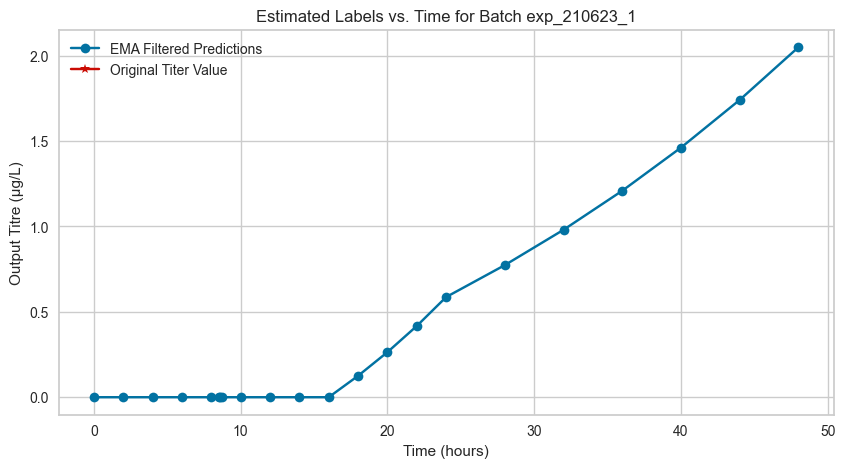

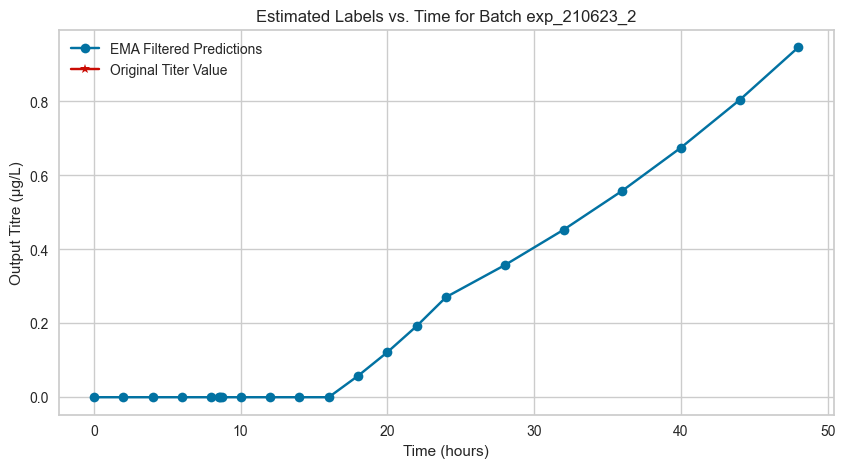

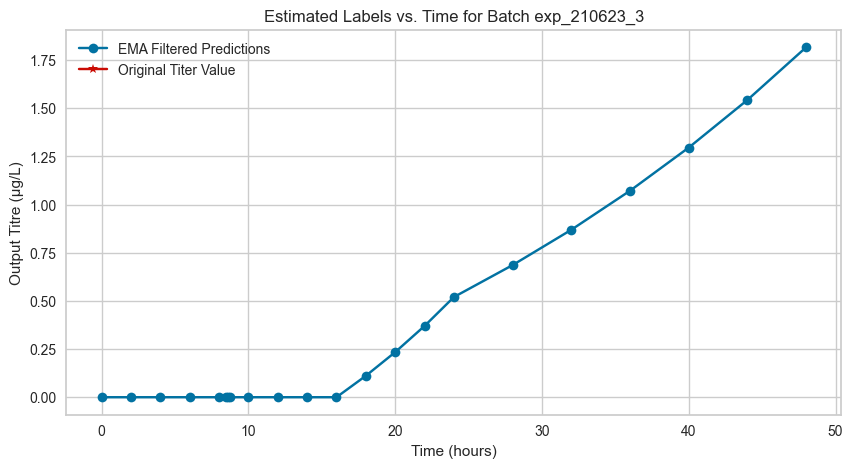

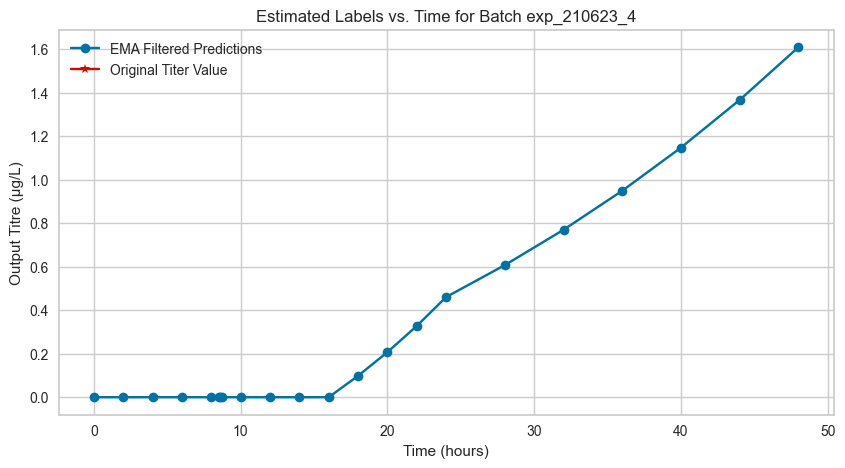

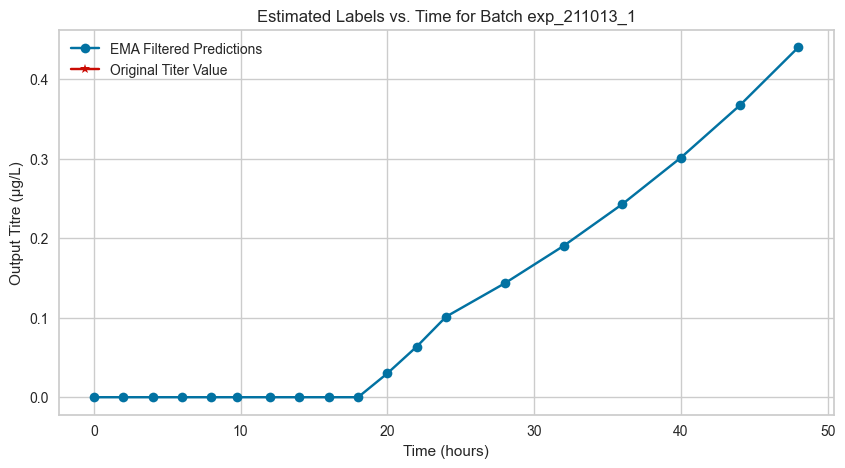

...

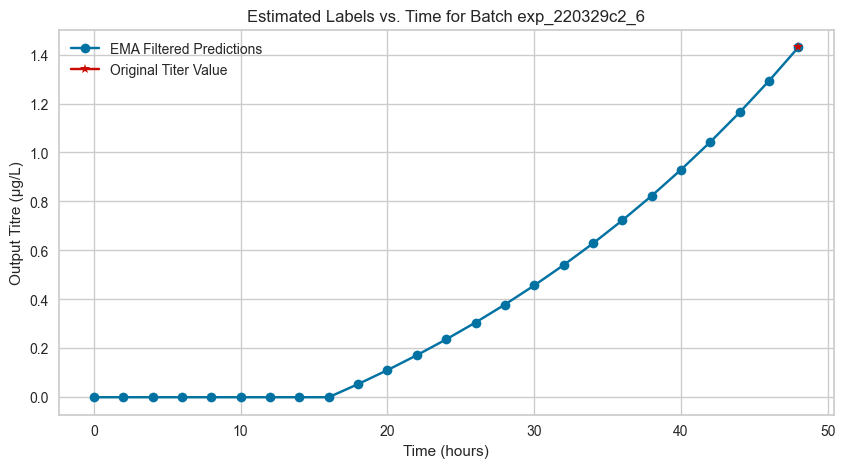

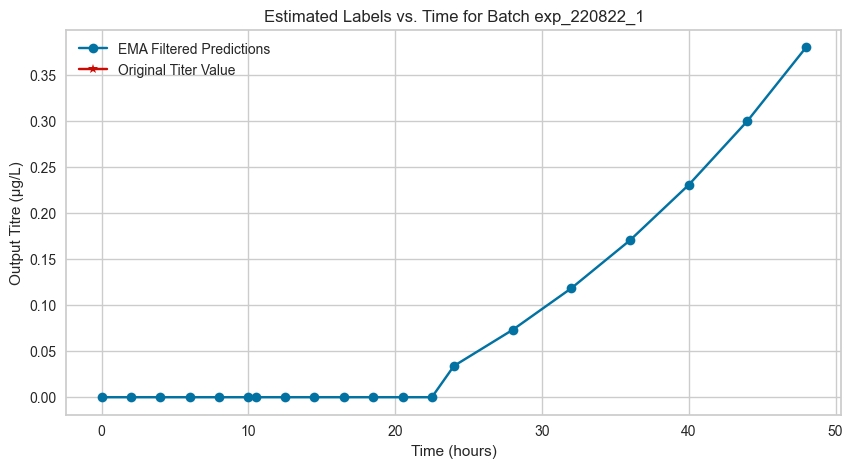

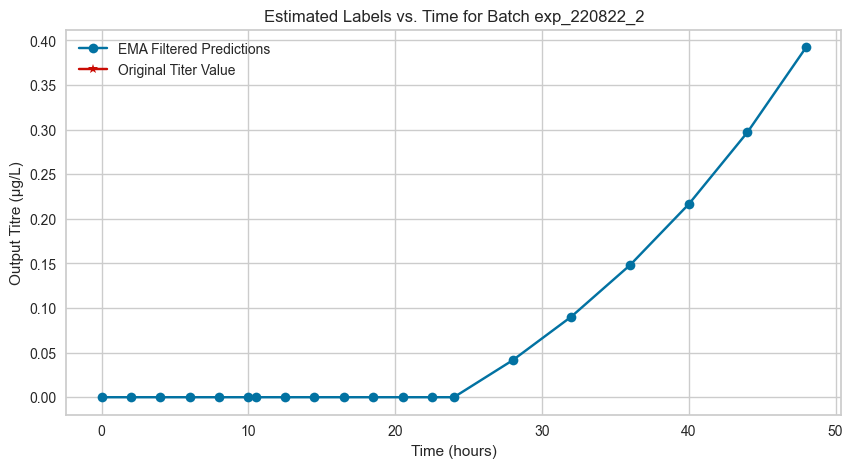

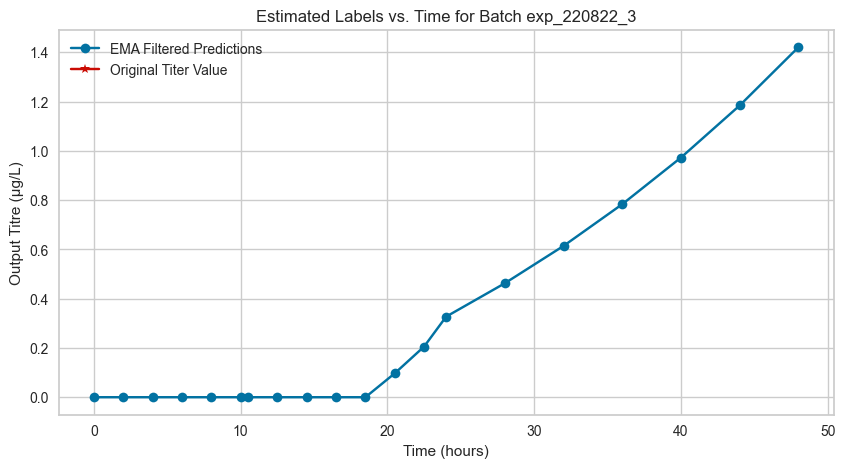

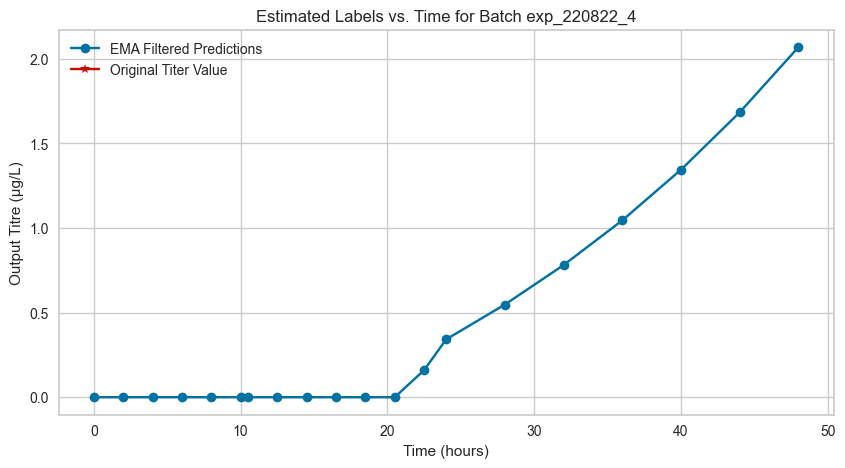

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "c:\Users\pault\anaconda3\Lib\asyncio\events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "c:\Users\pault\anaconda3\Lib\asyncio\selector_events.py", line 119, in _read_from_self
    data = self._ssock.recv(4096)
           ^^^^^^^^^^^^^^^^^^^^^^
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "c:\Users\pault\anaconda3\Lib\asyncio\events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "c:\Users\pault\anaconda3\Lib\asyncio\selector_events.py", line 119, in _read_from_self
    data = self._ssock.recv(4096)
           ^^^^^^^^^^^^^^^^^^^^^^
ConnectionReset

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_error

def exponential_moving_average(data, alpha=0.1):
    ema = np.zeros_like(data)
    ema[0] = data[0]
    for i in range(1, len(data)):
        ema[i] = alpha * data[i] + (1 - alpha) * ema[i-1]
    return ema

def train_evaluate_ema_filter(dataset, alpha=0.1):
    unique_batches = dataset['batch'].unique()

    ema_results = []
    for batch in unique_batches:
        batch_data = dataset[dataset['batch'] == batch]

        labels = batch_data['original_titer'].to_numpy()
        labels_2 = batch_data['output_titre_µgl'].to_numpy()
        time_vector = batch_data['input_Timepoint (hr)'].to_numpy()

        batch_data = batch_data.drop(columns=['batch', 'original_titer', 'input_batch'], axis=1)

        titer_values = batch_data['output_titre_µgl'].to_numpy()
        estimated_titer = exponential_moving_average(titer_values, alpha)

        # Create DataFrame for filtered results
        filtered_df = pd.DataFrame({
            'original_timepoint': time_vector,
            'original_titer': labels,
            'output_titre_µgl': estimated_titer,
            'output_titre_µgl_2': labels_2
        })
        ema_results.append((filtered_df, batch))

    return ema_results

def objective_function(params, dataset):
    alpha = params[0]
    results = train_evaluate_ema_filter(dataset, alpha)
    mse_list = []
    for batch_data, _ in results:
        mse = mean_squared_error(batch_data['output_titre_µgl_2'], batch_data['output_titre_µgl'])
        mse_list.append(mse)
    return np.mean(mse_list)

def optimize_hyperparameters(dataset):
    from scipy.optimize import minimize
    
    initial_guess = [0.1]
    bounds = [(0.001, 1.0)]
    
    result = minimize(objective_function, initial_guess, args=(dataset,), bounds=bounds, method='L-BFGS-B')
    best_params = result.x
    return best_params

best_params = optimize_hyperparameters(dataset)
alpha = best_params[0]

ema_results = train_evaluate_ema_filter(dataset, alpha)

# Plotting each batch's estimated labels vs. time
for batch_data, batch in ema_results:
    plt.figure(figsize=(10, 5))
    plt.plot(batch_data['original_timepoint'], batch_data['output_titre_µgl'], marker='o', linestyle='-', color='b', label='EMA Filtered Predictions')
    plt.plot(batch_data['original_timepoint'], batch_data['original_titer'], marker='*', linestyle='-', color='r', label='Original Titer Value') 
    plt.title(f'Estimated Labels vs. Time for Batch {batch}')
    plt.xlabel('Time (hours)')
    plt.ylabel('Output Titre (µg/L)')
    plt.grid(True)
    plt.legend()  # This adds the legend to the plot
    plt.show()
